In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import numpy as np
import os
from PIL import Image
import zipfile

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
# Configuration file
cfg = {
    "path_data": "~/Teaching/Deep_net/data_sets",
    "shouldPretrained": True,
    "shouldFreeze": True,
    "nbr_classes": 102
}

In [5]:
# Define transformations for the dataset
transform = transforms.Compose([
    transforms.Resize((240, 240)),
    transforms.ToTensor(),
])

In [6]:
# A) Load the data (train and test sets)
trainset = datasets.Flowers102(root=cfg["path_data"], split='train', download=True, transform=transform)
testset = datasets.Flowers102(root=cfg["path_data"], split='val', download=True, transform=transform)

100%|██████████| 344862509/344862509 [00:11<00:00, 30829582.74it/s]


Extracting /root/Teaching/Deep_net/data_sets/flowers-102/102flowers.tgz to /root/Teaching/Deep_net/data_sets/flowers-102


100%|██████████| 502/502 [00:00<00:00, 502755.64it/s]


100%|██████████| 14989/14989 [00:00<00:00, 37533386.66it/s]


In [7]:
# Define dataloaders
trainloader = torch.utils.data.DataLoader(trainset, batch_size=32, shuffle=True)
testloader = torch.utils.data.DataLoader(testset, batch_size=32, shuffle=False)

#A) Train a baseline model (linear model or CNN) and report the loss and accuracy on both train and test sets

In [8]:
# Define a simple CNN model as the baseline
class SimpleCNN(nn.Module):
    def __init__(self):
        super(SimpleCNN, self).__init__()
        self.conv1 = nn.Conv2d(3, 32, 3, padding=1)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(32, 64, 3, padding=1)
        self.fc1 = nn.Linear(64 * 60 * 60, 512)
        self.fc2 = nn.Linear(512, cfg["nbr_classes"])  # 102 classes

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))
        x = torch.flatten(x, 1)
        x = torch.relu(self.fc1(x))
        x = self.fc2(x)
        return x

In [9]:
# Initialize the model, loss function, and optimizer
model_baseline = SimpleCNN().to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model_baseline.parameters(), lr=0.001, momentum=0.9)

In [10]:
# Training the baseline model
epochs = 10
for epoch in range(epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data[0].to(device), data[1].to(device)
        optimizer.zero_grad()
        outputs = model_baseline(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    print(f'Epoch {epoch+1}, Loss: {running_loss / len(trainloader)}')

Epoch 1, Loss: 4.637043297290802
Epoch 2, Loss: 4.615006625652313
Epoch 3, Loss: 4.595765590667725
Epoch 4, Loss: 4.561843439936638
Epoch 5, Loss: 4.512239456176758
Epoch 6, Loss: 4.422426551580429
Epoch 7, Loss: 4.252174645662308
Epoch 8, Loss: 4.003624819219112
Epoch 9, Loss: 3.713673882186413
Epoch 10, Loss: 3.4132903814315796


In [15]:
# Evaluate the baseline model on the test set
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = model_baseline(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the baseline model on the test set: {100 * correct / total}%')

Accuracy of the baseline model on the test set: 7.8431372549019605%


#B) Use a pre-trained model to answer question (A).

In [16]:
# Load a pretrained model
myModel = models.efficientnet_b1(pretrained=cfg['shouldPretrained'])

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B1_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B1_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/efficientnet_b1_rwightman-bac287d4.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b1_rwightman-bac287d4.pth
100%|██████████| 30.1M/30.1M [00:00<00:00, 82.7MB/s]


In [17]:
# Freeze all parameters if required
if cfg['shouldFreeze']:
    for param in myModel.parameters():
        param.requires_grad = False

In [18]:
# Change last layer
num_ftrs = myModel.classifier[1].in_features  # 1280 features for the last layer
myModel.classifier = nn.Linear(num_ftrs, cfg["nbr_classes"])

In [19]:
# Initialize the model, loss function, and optimizer
optimizer_pretrained = optim.SGD(myModel.parameters(), lr=0.001, momentum=0.9)

In [20]:
# Move the model to the device
myModel = myModel.to(device)

# Training the pre-trained model
for epoch in range(epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data[0].to(device), data[1].to(device)
        optimizer_pretrained.zero_grad()
        outputs = myModel(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer_pretrained.step()
        running_loss += loss.item()
    print(f'Epoch {epoch+1}, Loss: {running_loss / len(trainloader)}')

Epoch 1, Loss: 4.653889894485474
Epoch 2, Loss: 4.546393096446991
Epoch 3, Loss: 4.437311723828316
Epoch 4, Loss: 4.329260468482971
Epoch 5, Loss: 4.2211587727069855
Epoch 6, Loss: 4.112076207995415
Epoch 7, Loss: 4.016846612095833
Epoch 8, Loss: 3.9092367440462112
Epoch 9, Loss: 3.8073620423674583
Epoch 10, Loss: 3.7139846310019493


In [ ]:
# Evaluate the pre-trained model on the test set
correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data[0].to(device), data[1].to(device)
        outputs = myModel(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print(f'Accuracy of the pre-trained model on the test set: {100 * correct / total}%')

Accuracy of the pre-trained model on the test set: 21.176470588235293%


# C) Report the predicted classes for the 50 images in the zip folder examples_flowers.zip

In [ ]:
#Mounting Gdrive
from google.colab import drive

drive.mount('/content/drive/')

In [ ]:
# Extract the zip folder
zip_ref = zipfile.ZipFile("examples_flowers.zip", 'r')
zip_ref.extractall("examples_flowers")
zip_ref.close()

In [ ]:
# Create a list to store the predicted classes
predicted_classes = []

test_path = 'examples_flowers/examples_flowers'
# Loop through the images in the folder
for filename in os.listdir(test_path):
    if filename.endswith('.jpg'):
        # Open the image
        print(f'Image {filename} is now processed')
        img = Image.open(os.path.join(test_path, filename))
        # Apply the transformation
        img = transform(img)
        # Add batch dimension
        img = img.unsqueeze(0).to(device)
        # Perform inference
        with torch.no_grad():
            output = model_baseline(img)
            _, predicted = torch.max(output, 1)
            predicted_classes.append(predicted.item())

Image image21.jpg is now processed
Image image38.jpg is now processed
Image image43.jpg is now processed
Image image02.jpg is now processed
Image image16.jpg is now processed
Image image11.jpg is now processed
Image image05.jpg is now processed
Image image15.jpg is now processed
Image image33.jpg is now processed
Image image31.jpg is now processed
Image image27.jpg is now processed
Image image13.jpg is now processed
Image image36.jpg is now processed
Image image10.jpg is now processed
Image image29.jpg is now processed
Image image08.jpg is now processed
Image image22.jpg is now processed
Image image19.jpg is now processed
Image image48.jpg is now processed
Image image41.jpg is now processed
Image image25.jpg is now processed
Image image03.jpg is now processed
Image image24.jpg is now processed
Image image49.jpg is now processed
Image image46.jpg is now processed
Image image06.jpg is now processed
Image image20.jpg is now processed
Image image47.jpg is now processed
Image image14.jpg is

In [ ]:
# Print the predicted classes
print("Predicted classes for the images:")
print(predicted_classes)


Predicted classes for the images:
[67, 1, 31, 38, 0, 97, 67, 88, 37, 46, 57, 55, 58, 5, 31, 88, 1, 17, 35, 40, 67, 38, 0, 84, 58, 38, 88, 88, 88, 55, 40, 90, 38, 7, 19, 17, 13, 78, 88, 45, 58, 4, 45, 0, 38, 74, 10, 41, 66, 38]


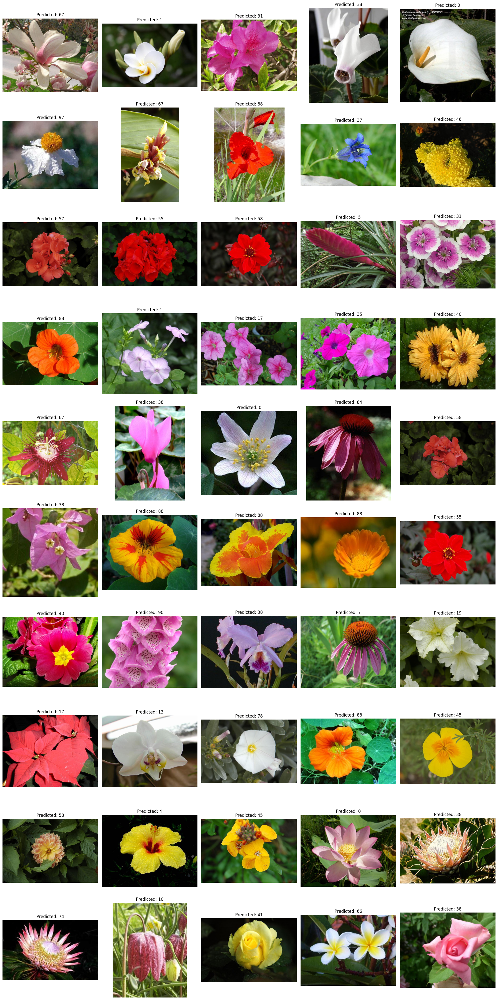

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import torch
from torchvision import transforms


test_path = 'examples_flowers/examples_flowers'
predicted_classes = []

# Get all jpg filenames in the test_path
image_filenames = [filename for filename in os.listdir(test_path) if filename.endswith('.jpg')]

# Determine the number of rows needed to display the images
num_rows = len(image_filenames) // 5 + (len(image_filenames) % 5 != 0)

# Set up the matplotlib figure and axes
fig, axes = plt.subplots(num_rows, 5, figsize=(20, 4 * num_rows))
axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

# Loop through the images in the folder and plot them
for i, filename in enumerate(image_filenames):
    # Open the image
    img_path = os.path.join(test_path, filename)
    img = Image.open(img_path)

    # Apply the transformation and add batch dimension
    img_transformed = transform(img).unsqueeze(0).to(device)

    # Perform inference
    with torch.no_grad():
        output = model_baseline(img_transformed)
        _, predicted = torch.max(output, 1)
        predicted_classes.append(predicted.item())

    # Plotting the image
    ax = axes[i]
    ax.imshow(img)
    ax.set_title(f'Predicted: {predicted.item()}')
    ax.axis('off')

# Turn off any remaining axes not used
for ax in axes[i+1:]:
    ax.axis('off')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()
